In [1]:
import xarray as xr
from dask.distributed import Client
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import datetime as dt

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:35605,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:44579,Total threads: 2
Dashboard: /proxy/32929/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:41147,


In [3]:
def preprocess(ds):
    ds["time"] = pd.to_datetime(ds["time"]) + dt.timedelta(hours=10)
    ds = ds.sel(time=(ds.time.dt.hour >= 9) & (ds.time.dt.hour <= 21))
    ds.attrs["time_zone"] = "AEST"
    ds.attrs["local_time_restriction"] = "0900_2100"
    
    return ds.groupby("time.date").max().rename({"date":"time"})

f = xr.open_mfdataset("/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/filtered_mask_standard_F_*",
                      engine="zarr",preprocess=preprocess).persist()
f["time"] = pd.to_datetime(f.time)
f.chunk({"time":101}).to_zarr("/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/daily_filtered_standard_F_aest_19790101_20250101.zarr",mode="w")



/g/data/xp65/public/apps/med_conda/envs/analysis3-25.06/lib/python3.11/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 12.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [4]:
def preprocess(ds):
    ds["time"] = pd.to_datetime(ds["time"]) + dt.timedelta(hours=8)
    ds = ds.sel(time=(ds.time.dt.hour >= 9) & (ds.time.dt.hour <= 21))
    ds.attrs["time_zone"] = "AWST"
    ds.attrs["local_time_restriction"] = "0900_2100"
    
    return ds.groupby("time.date").max().rename({"date":"time"})

f = xr.open_mfdataset("/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/filtered_mask_standard_F_*",
                      engine="zarr",preprocess=preprocess).persist()
f["time"] = pd.to_datetime(f.time)
f.chunk({"time":101}).to_zarr("/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/daily_filtered_standard_F_awst_19790101_20250101.zarr",mode="w")



/g/data/xp65/public/apps/med_conda/envs/analysis3-25.06/lib/python3.11/site-packages/distributed/client.py:3363: UserWarning: Sending large graph of size 12.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [4]:
fdaily = xr.open_dataset("/g/data/ng72/ab4502/sea_breeze_detection/barra_c_smooth_s2/filters/daily_filtered_standard_F_19790101_20250101.zarr",engine="zarr",chunks={}).mask


In [5]:
orog = xr.open_dataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/fx/orog/latest/orog_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1.nc")


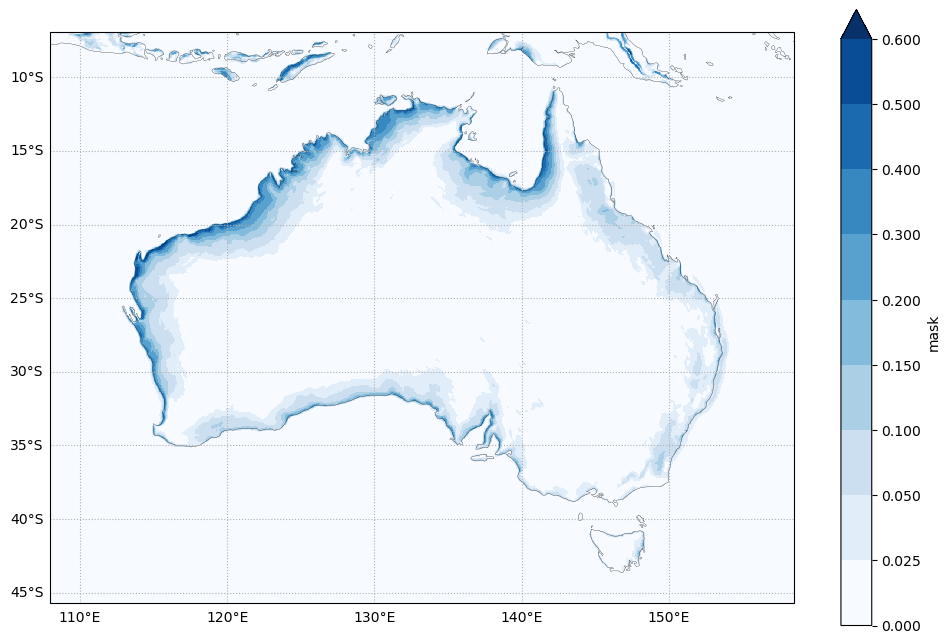

In [6]:
levels = [0,0.025,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

plt.figure(figsize=[12,8])

ax=plt.axes(projection=ccrs.PlateCarree())
fdaily.mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])

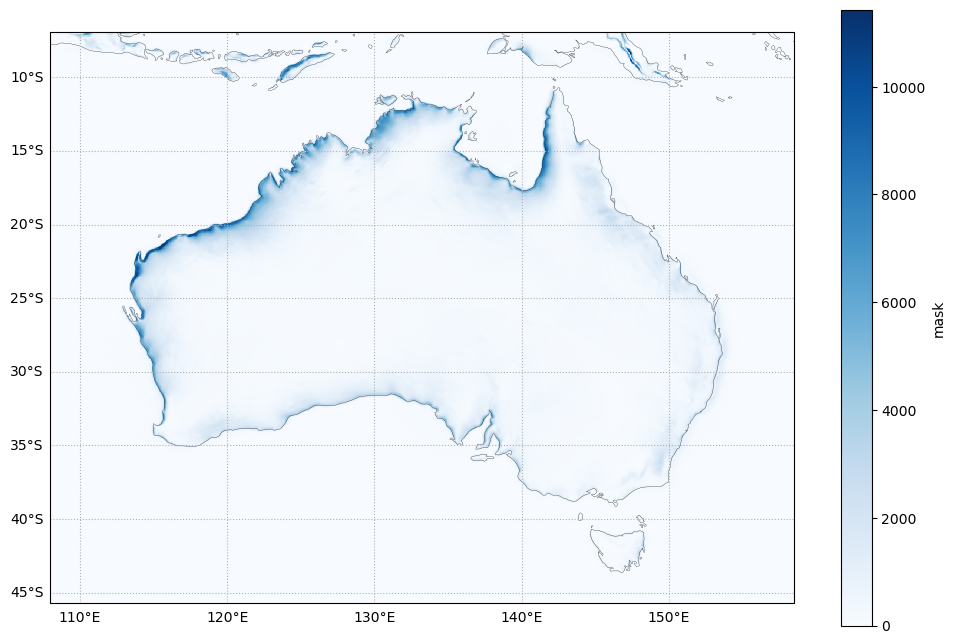

In [7]:
plt.figure(figsize=[12,8])

ax=plt.axes(projection=ccrs.PlateCarree())
fdaily.sum("time").plot(cmap="Blues")
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])

Text(0.5, 1.0, 'SON')

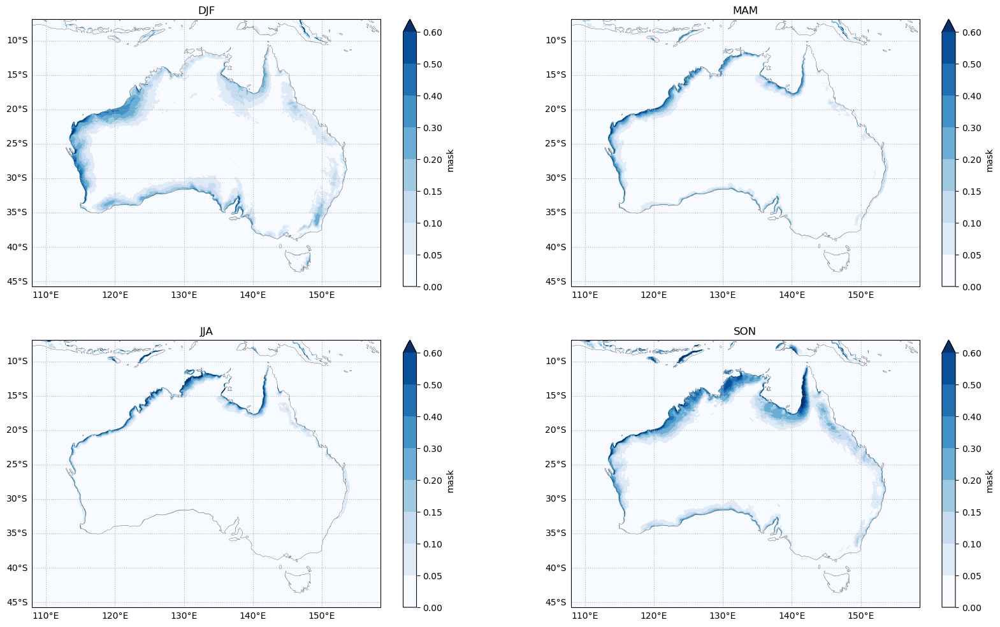

In [8]:
levels = [0,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("DJF")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[3,4,5])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("MAM")

ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[6,7,8])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("JJA")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("SON")

In [10]:
u = xr.open_mfdataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/mon/ua850/latest/ua850_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1_mon_*",chunks={})
v = xr.open_mfdataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/mon/va850/latest/va850_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1_mon_*",chunks={})

In [13]:
umean = u.ua850.mean("time").persist()
vmean = v.va850.mean("time").persist()

In [17]:
umean_season = u.ua850.groupby("time.season").mean().persist()
vmean_season = v.va850.groupby("time.season").mean().persist()

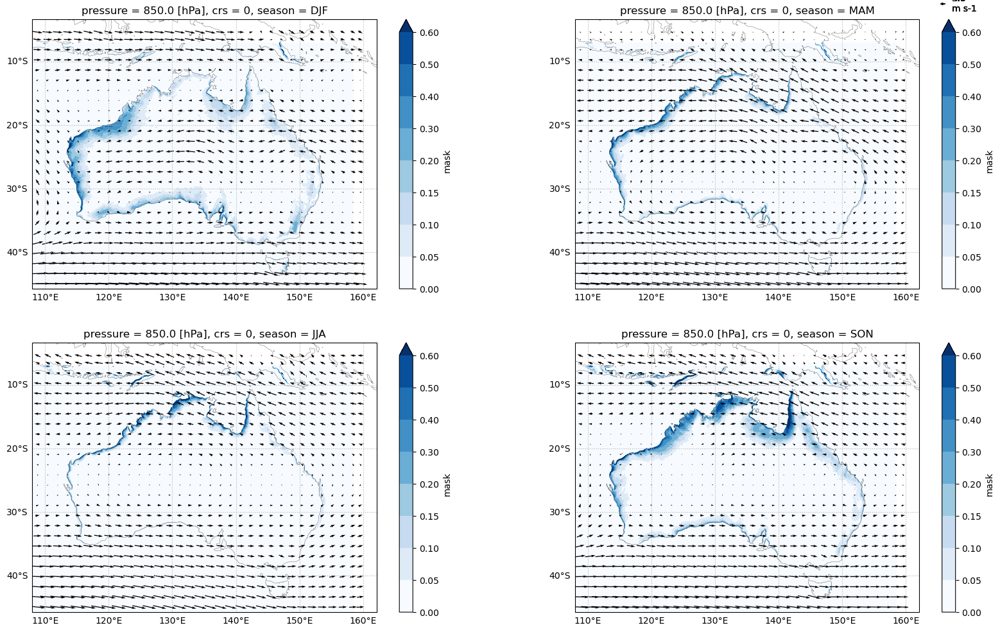

In [22]:
levels = [0,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

c=40

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("DJF")

xr.Dataset({"u":umean_season.sel(season="DJF"),"v":vmean_season.sel(season="DJF")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")


ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[3,4,5])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("MAM")
xr.Dataset({"u":umean_season.sel(season="MAM"),"v":vmean_season.sel(season="MAM")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")

ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[6,7,8])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("JJA")
xr.Dataset({"u":umean_season.sel(season="JJA"),"v":vmean_season.sel(season="JJA")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")

ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
fdaily.sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("SON")
xr.Dataset({"u":umean_season.sel(season="SON"),"v":vmean_season.sel(season="SON")}).coarsen({"lat":c,"lon":c},boundary="pad").mean().\
    plot.quiver(x="lon",y="lat",u="u",v="v")

In [23]:
tasmax = xr.open_mfdataset("/g/data/ob53/BARRA2/output/reanalysis/AUST-04/BOM/ERA5/historical/hres/BARRA-C2/v1/mon/tasmax/latest/tasmax_AUST-04_ERA5_historical_hres_BOM_BARRA-C2_v1_mon_*",chunks={})

In [25]:
tasmax_mean_season = tasmax.tasmax.groupby("time.season").mean().persist()

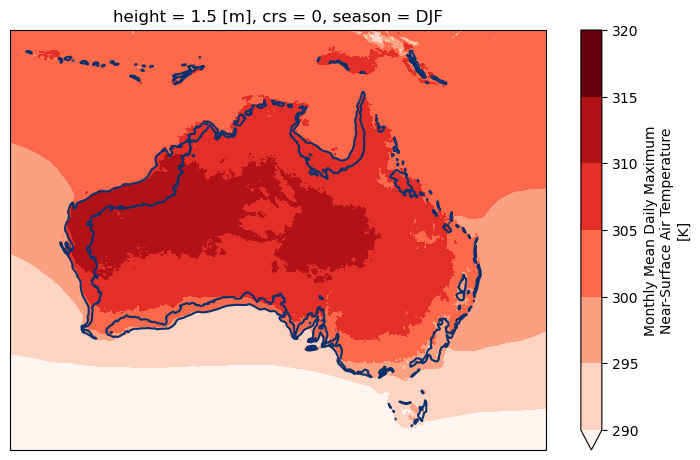

In [44]:
levels = [0.1]

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
xr.plot.contour(fdaily.sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time"),levels=levels,cmap="Blues")
xr.plot.contourf(tasmax_mean_season.sel(season="DJF"),levels=[290,295,300,305,310,315,320],cmap="Reds")


# ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
# xr.plot.contour(fdaily.sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time"),levels=levels,cmap="Blues")
# xr.plot.contourf(tasmax_mean_season.sel(season="SON"),levels=[290,295,300,305,310,315,320],cmap="Reds")

In [ ]:
levels = [0,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6]

lat_slice=slice(-45,-30)
lon_slice=slice(135,155)

plt.figure(figsize=[20,12])

ax=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("DJF")

ax=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[3,4,5])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
plt.title("MAM")


ax=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[6,7,8])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
plt.title("JJA")


ax=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[9,10,11])).mean("time").plot(cmap="Blues",levels=levels)
ax.coastlines(lw=0.2)
xr.plot.contour(
    orog.orog.sel(lat=lat_slice,lon=lon_slice),
    levels=[500],
    colors=["k"],
    linewidths=0.2,
    add_colorbar=False)  
ax.gridlines(ls=":",draw_labels=["left","bottom"])
plt.title("SON")

In [54]:
p2 = fdaily.sel(time=(fdaily.time.dt.year >= 2002) & (fdaily.time.dt.year <= 2024))
p1 = fdaily.sel(time=(fdaily.time.dt.year >= 1979) & (fdaily.time.dt.year <= 2001))

p2 = (p2.sum("time") / (p2.time.shape[0] / 365)).persist()
p1 = (p1.sum("time") / (p1.time.shape[0] / 365)).persist()

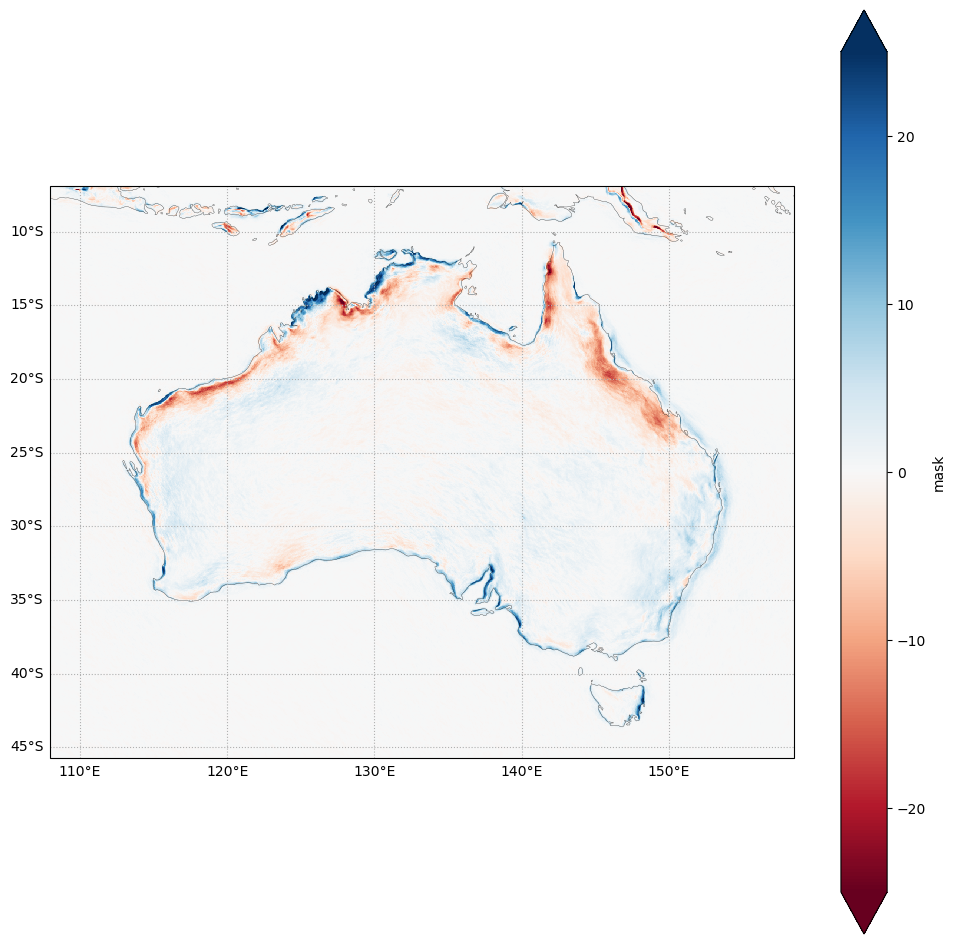

In [59]:
plt.figure(figsize=[12,12])
ax=plt.axes(projection=ccrs.PlateCarree())
(p2-p1).plot(ax=ax,cmap="RdBu",vmin=-25,vmax=25)
ax.coastlines(lw=0.2)
ax.gridlines(ls=":",draw_labels=["left","bottom"])

In [60]:
import hvplot.xarray

In [61]:
fdaily.sel(lat=lat_slice,lon=lon_slice).sel(time=np.in1d(fdaily.time.dt.month,[1,2,12])).mean("time").hvplot(height=600,cmap="Blues")

:Image   [lon,lat]   (mask)

In [66]:
(p2-p1).hvplot(height=600,cmap="RdBu")

:Image   [lon,lat]   (mask)